Determine the chance probability of finding unidentified GeV sources near SNRs coincident with molecular clouds. Do a Monte Carlo simulation to generat "catalogs" and test how often the fake sources lie within the range of interest for a SNR.

* The question I want to answer is: How likely is it for an unidentified source to: 
    1. lie within in 50pc of the edge of an snr
    2. coincide spatially with a peak in CO emission from a molecular cloud
* Keep the positions of the SNRs fixed
* Generate "mock" 3FGL catalogs by doing a monte carlo simulation which randomizes the positions of all 3FGL source
* See where the mock sources lie wrt to SNRs
    * Essentially, redo my nby candidates analysis on the mock catalog and see what the distribution of sources is within 50pc
    * Eventually work in something to do with how the mock catalog falls wrt to the molecular clouds
    * My initial nby candidates work considers unID'd sources. 
    * Fow the mock catalogs, I try searching for sources within 50pc with out considering whether a sources is ID'd or not, and another run preserving ID of the original source
    * Eventually randomize ID by drawing from binomial distribution of actual 3FGL ID'd or not?

##Monte Carlo Method:

Start with 3FGL sources, perturb the coordinates of each source as follows

$l' = l+R*lshift$,

$b' = b+R*bshift$

with R = random # drawn from uniform distribution from [-1,1]

and l (b)shift = range of allowable l (b) values

The real distribution of 3FGL sources in l,b:
add the plots I have showing test examples

In [1]:
import numpy as np
import pandas as pd
import scipy.stats as st
#import scipy.stats.mstats as mst not sure I need the masked version yet
import yaml
from scipy.special import erfinv
from IPython.core.display import Image 
pd.options.display.mpl_style = 'default'
#import matplotlib.pyplot as plt


##3FGL b Distribution 

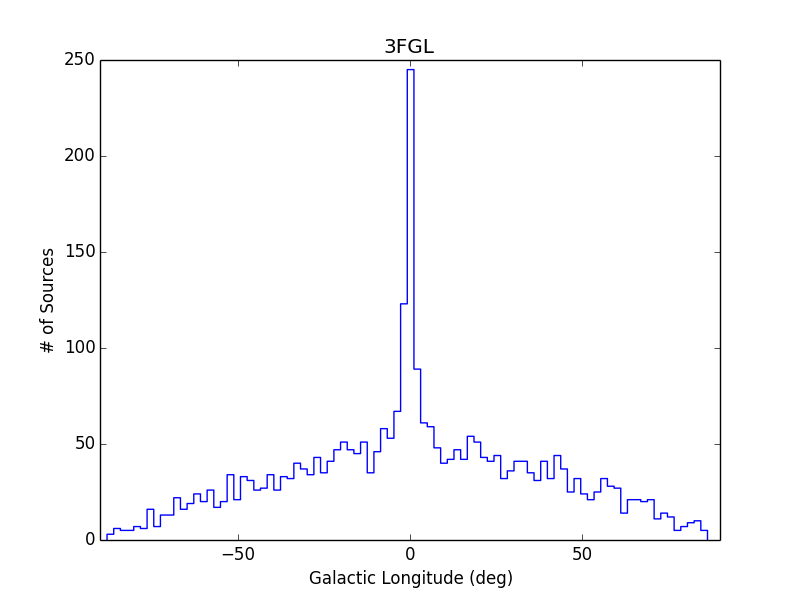

In [140]:
#This is for PDFs
#from wand.image import Image as WImage
#img = WImage(filename='/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/3FGL_l2_b2_scatHist.pdf') 
#img
#this is for png/jpg
figure
Image(filename='/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/3FGL_b.png')

##3FGL l Distribution 

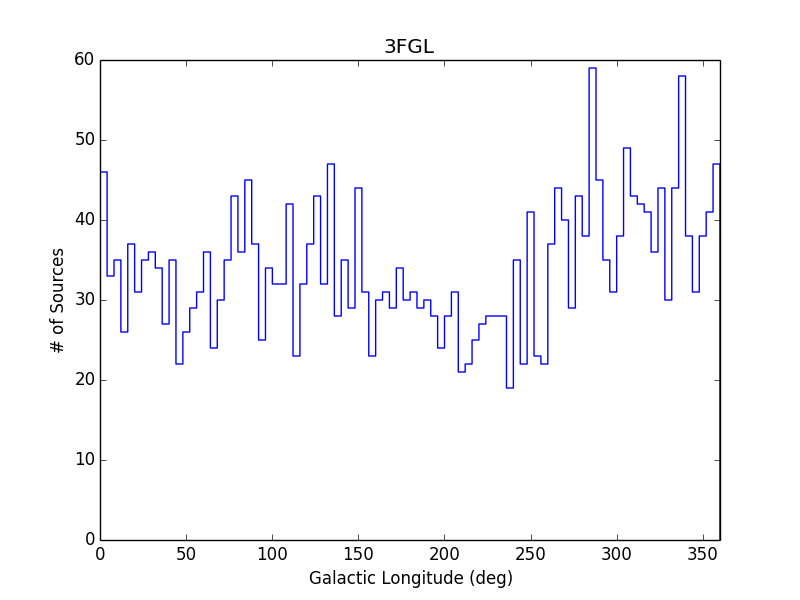

In [147]:
Image(filename='/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/3FGL_l.png')

##Example Mock Catalog l/b Distributions
lshift = 20 deg, bshift = 2 deg

In [148]:
#Need to either get wand working on my computer since I updated to mavericks, which means reinstalling macports
#Or convert pdf to png
#Image(filename='/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/1rlz_l20_b2/mock_l20_b2_scatHist.pdf')

###What is the chance coincidence of a simulated source falling inside 50pc, outside remnant. Limit SNR sample to only those within 6 kpc

Candidate if 3FGL/mock source is :
1. Within 50 pc of SNR edge, assuming source is at same distance as SNR
2. Outside the radio defined radius
3. More than 0.3 deg from edge of SNR (more important for point SNRs), i.e. resolvable from SNR
4. ID'd and Not ID'd: (for 3FGL ID'd means ID_Probability < 0.8 (similar to 2FGL)). Do 2 different runs, 1 where I ignore the not ID'd criteria, and another where I only look for not I'd sources  

nSNRs: # Of SNRs for a singl realization for which I have at least 1 candidate source

nCands: Total # candidate source for a single realization for all SNRs therein

#Results Averaged Over  all Runs all SNRs (not sure how use the properties of the whole are)

##Results for lshift = +/- 5, bshift = +/-2, nrealz = 1500. 

NoId: Don't consider whether a source is ID'd or not when determining if it's a candidate

Wid: I only consider sources that are ID'd and I preserve the ID for all shifted sources.



###For 3FGL

In [133]:
#get the nSnrs nCands for 3FGL  
fglWid = pd.read_csv('/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/lbRan_l20_b2_n1500/3FGLsnrNcandCountsWid.txt')
fglWid

,nSnrs,nCands
0,39,155


In [69]:
fglNoId = pd.read_csv('/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/lbRan_l20_b2_n1500/3FGLsnrNcandCountsNoId.txt')
fglNoId

,nSnrs,nCands
0,47,237


###For the Mock Catalogs

In [2]:
mcsNoId = pd.read_csv('/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/lbRan_l20_b2_n1500/snrNcandCountsNoId.txt')
mcsNoId.describe()

,nSnrs,nCands
count,1499.000000,1499.000000
mean,43.705137,195.486324
std,3.122517,12.206022
min,33.000000,149.000000
25%,42.000000,187.000000
50%,44.000000,195.000000
75%,46.000000,204.000000
max,53.000000,235.000000


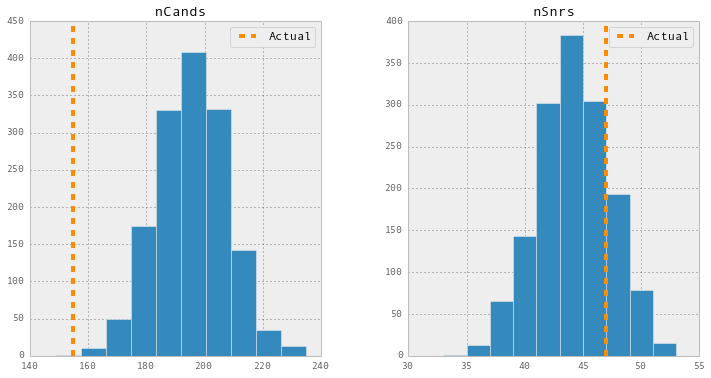

In [76]:
ax = mcsNoId.hist(figsize= (12,6))
ax[0,1].axvline(x = fglNoId['nSnrs'].values, color = 'DarkOrange', lw = 4, ls = '--',label = 'Actual')
ax[0,1].legend()
ax[0,0].axvline(x = fglNoID[' nCands'].values, color = 'DarkOrange', lw = 4, ls = '--', label = 'Actual')
ax[0,0].legend()


In [130]:
mcsWid = pd.read_csv('/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/singRand_l5_b2_n1500/snrNcandCountsWid.txt')
mcsWid.describe()

,nSnrs,nCands
count,1500.000000,1500.000000
mean,39.866000,149.422000
std,3.047551,8.346798
min,29.000000,117.000000
25%,38.000000,144.000000
50%,40.000000,150.000000
75%,42.000000,155.000000
max,50.000000,177.000000


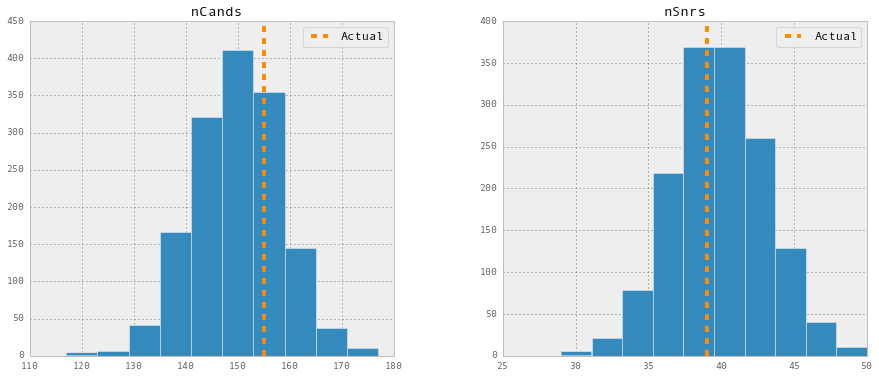

In [79]:
ax = mcsWid.hist(figsize=(15,6))
ax[0,1].axvline(x = fglWid['nSnrs'].values, color = 'DarkOrange', lw = 4, ls = '--',label = 'Actual')
ax[0,1].legend()
ax[0,0].axvline(x = fglWid[' nCands'].values, color = 'DarkOrange', lw = 4, ls = '--',label = 'Actual')
ax[0,0].legend()

#Distribution of Sources in 50pc for Individual SNRs
One run considering ID, one ignoring it (not show yet below). 

1500 realizations, lshift = 20, bshift = 2

Red line: calculated Gaussian using the mean/std of the distribution

Purple line: fitted gaussian

Orange line: # of candidates in 50pc, outside remnant, ID'd or not, for real 3FGL data

I included SNRs that had mock sources within 50pc but weren't on my list for real 3FGL data




In [2]:
import pyJam.fermi.SNR_MC.nbyMonte as M
#from scipy.stats import norm
import matplotlib.mlab as mlab
#pd.options.display.mpl_style = 'default'

In [5]:
reload(M)
p,fgl = M.postNby(normed = True, mkPlots = False)

resPanel.dat already exists, load it in
resPanel.dat already exists, load it in
ERROR: ValueError: too many values to unpack [IPython.core.interactiveshell]


ValueError: too many values to unpack

In [26]:
nbyInd = p.major_axis.get_loc('# Nearby')
numNby4SNRs = p.major_xs(p.major_axis[nbyInd]).T #default is rows:snrs, cols:runs, want cols:snrs, rows:runs
#don't need this cols
del numNby4SNRs['# SNR']
del numNby4SNRs['# allNby']
numNby4SNRs

,SNR005.4-01.2,SNR006.4-00.1,SNR008.7-00.1,SNR009.7-00.0,SNR011.2-00.3,SNR012.8-00.0,SNR013.3-01.3,SNR015.1-01.6,SNR015.4+00.1,SNR016.8-01.1,SNR018.6-00.2,SNR021.5-00.9,SNR021.8-00.6,SNR023.3-00.3,SNR027.8+00.6,SNR028.8+01.5,SNR034.7-00.4,SNR049.2-00.7,SNR054.4-00.3,SNR069.0+02.7,
run0,NaN,1,NaN,NaN,NaN,NaN,1,NaN,1,1,NaN,NaN,1,2,NaN,3,1,NaN,1,2,...
run1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,2,4,NaN,1,3,1,NaN,NaN,4,...
run2,NaN,2,2,2,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,1,3,NaN,NaN,2,...
run3,1,6,NaN,NaN,NaN,1,2,NaN,2,1,1,NaN,NaN,1,1,1,NaN,NaN,2,4,...
run4,NaN,2,1,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,3,NaN,NaN,2,...
run5,1,6,1,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,3,2,1,1,2,3,NaN,1,3,...
run6,1,2,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,2,2,1,2,NaN,1,2,...
run7,NaN,1,NaN,1,NaN,NaN,1,1,1,NaN,NaN,NaN,NaN,NaN,2,1,3,1,NaN,1,...
run8,NaN,8,2,NaN,NaN,NaN,1,NaN,1,NaN,1,1,NaN,NaN,2,1,2,1,1,3,...
run9,1,1,1,2,NaN,NaN,NaN,2,1,NaN,NaN,NaN,NaN,1,1,2,3,NaN,2,3,...


In [3]:
#For fitting gaussian to histogram
from scipy import optimize
def gauss(x, a, m, s):
    return a * exp(-(x - m)**2.0 / (2 * s**2))
    #return  np.resize(a * exp(-(x - b)**2.0 / (2 * c**2)),3)
def normGauss(x, m, s):
    return (1 / (s * sqrt(2 * pi)) * exp(-0.5 * ((x - m) / s) ** 2))


###I moved all this into nbyMonte.py

Populating the interactive namespace from numpy and matplotlib


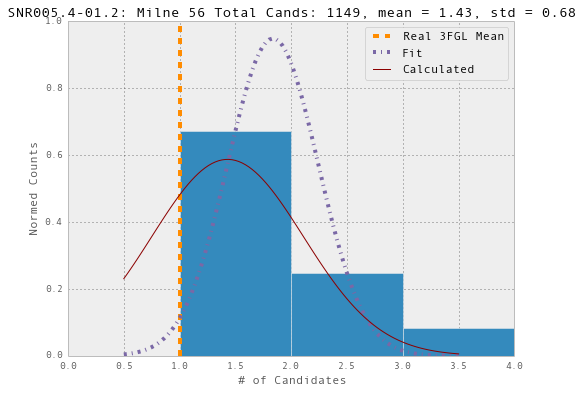

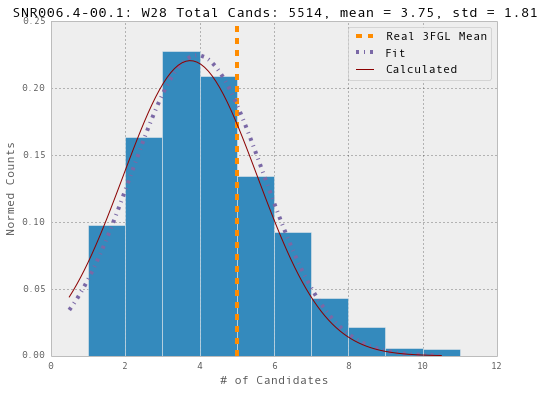

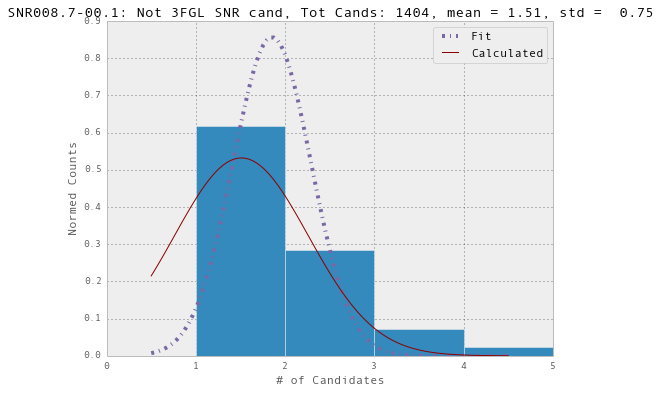

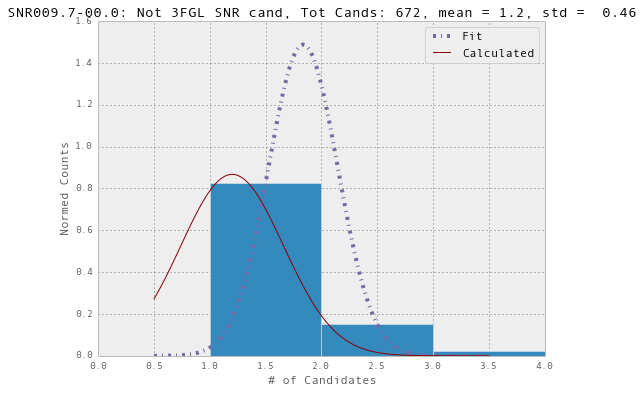

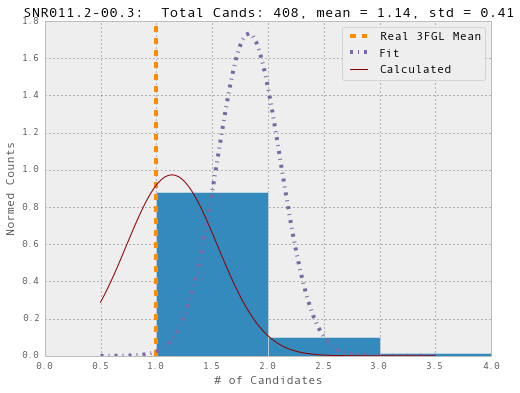

...

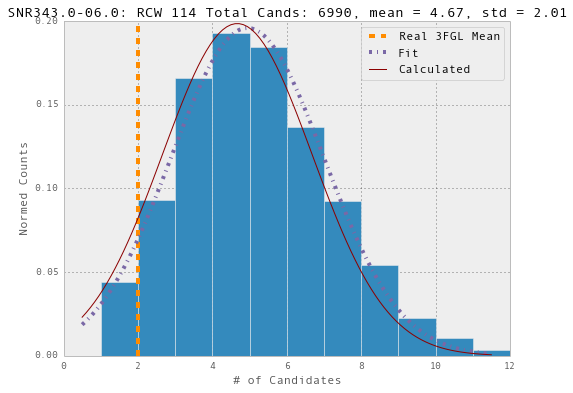

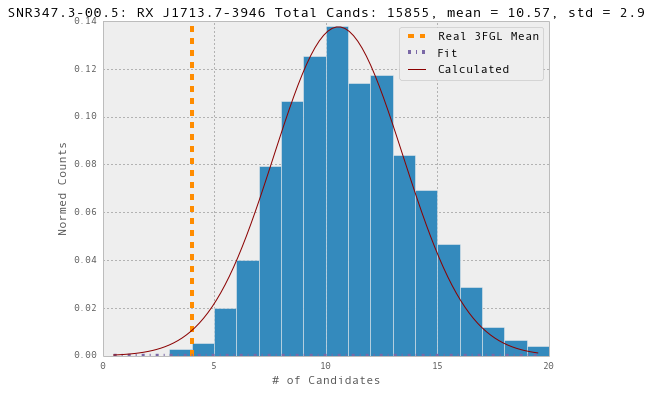

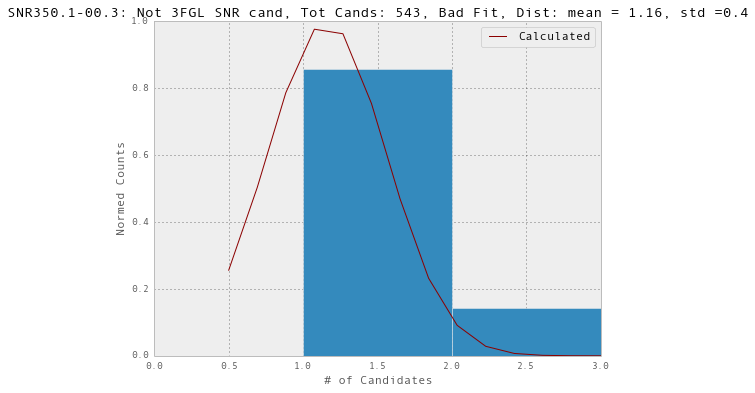

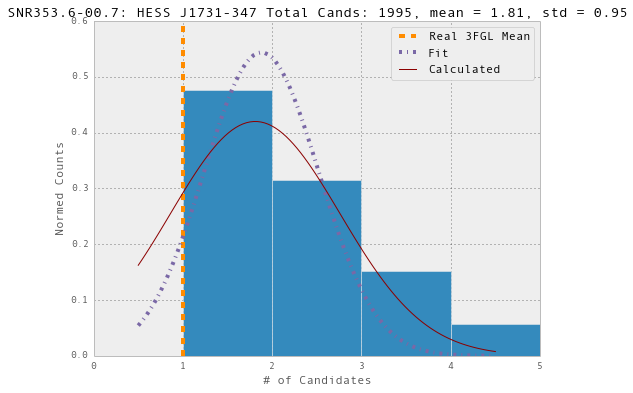

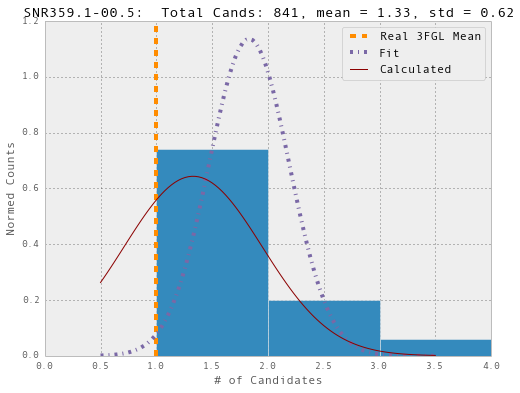

In [198]:
#Normed
%pylab inline
pd.options.display.mpl_style = 'default'
normed = True
for i in numNby4SNRs.columns[0]:
    figure()
    m=round(numNby4SNRs[i].mean(),2)
    s=round(numNby4SNRs[i].std(),2)
    if i in fgl:
        mfgl=fgl.get(i).get('# Nearby')
        nick=fgl.get(i).get('NickName')
        if nick == 'None': nick=''
    else:
        mfgl = None
    maxCands = numNby4SNRs[i].max()
    binsH = np.linspace(0,maxCands, maxCands+1)
    #numNby4SNRs[i].hist(bins = binsH) #my problem with this is that I don't know how to get n, bins from it
    figure(figsize = (8,6))
    n,nbins,_ = hist(numNby4SNRs[i].dropna(), bins = binsH,normed = normed) #hist doesn't handle norms like pandas hist does
    xlabel('# of Candidates')
    xlim(xmin = 0)
    #binsNorm = np.linspace(0,maxCands,100)
    #plot(binsNorm,mlab.normpdf(binsNorm,m,s))
    #y = normpdf(binsH,m,s)
    #plot(binsH,y,'purple')
    totalCands = str(numNby4SNRs[i].sum())
    if mfgl:
        axvline(mfgl,0,1,color = 'DarkOrange',ls='--',lw = 4,label = 'Real 3FGL Mean') #this is the 3FGL value here, for now just plot it as mean
        title('%(i)s: %(nick)s Total Cands: %(totalCands)s, mean = %(m)s, std = %(s)s ' %locals())
    else:
        title('%(i)s: Not 3FGL SNR cand, Tot Cands: %(totalCands)s, mean = %(m)s, std =  %(s)s ' %locals())
        
    # Fit a gaussian to the histogram. Are the bins right?
    x = [0.5 * (nbins[j] + nbins[j+1]) for j in xrange(len(nbins)-1)]
    #x = nbins[:-1]
    try:
        popt, pcov = optimize.curve_fit(gauss, x, n)
        x_fit = np.linspace(x[0], x[-1], 100)
        y_fit = gauss(x_fit, *popt)
        if normed:
            plot(x_fit, y_fit,lw =4,ls = '-.',label = 'Fit')#,label = 'Fit: mean=%(popt[1])s,std=%(popt[2])s' %locals())
        else:
            plot(x_fit, y_fit,lw =4,ls = '-.',label = 'Fit')#,label = 'Fit: mean=%(popt[1])s,std =%(popt[2])s' %locals())
    except RuntimeError, err:
        if mfgl:
            title('%(i)s: %(nick)s, Total Cands: %(totalCands)s, Bad Fit, Dist: mean =  %(m)s, std = %(s)s' %locals())
        else:
            title('%(i)s: Not 3FGL SNR cand, Tot Cands: %(totalCands)s, Bad Fit, Dist: mean = %(m)s, std =%(s)s' %locals())
        pass
    except TypeError, err:
        if mfgl:
            title('%(i)s: %(nick)s, Total Cands: %(totalCands)s, Type Error, Dist: mean =  %(m)s, std = %(s)s' %locals())
        else:
            title('%(i)s: Not 3FGL SNR cand, Tot Cands: %(totalCands)s, Type Error, Dist: mean = %(m)s, std =%(s)s' %locals())
    pass
    #plot a guassian with mean, std derived from the actual distribution
    yNormed = normGauss(x_fit,m,s) #do i use x_fit, or make an array using 
    if normed:
        plot(x_fit,yNormed,label = 'Calculated',color = 'DarkRed')
        ylabel('Normed Counts')
    else:
        plot(x_fit,yNormed*len(numNby4SNRs[i].dropna()),label = 'Calculated',color = 'DarkRed')
        ylabel('Counts')
    legend()
    #test chi2 between hist and 
    st.chisquare(
    



##Is something wrong with the calculated gauss below? Normalization looks off
* To normalize I just multiply the values from normGauss by binwidth (which is 1) * len(data)

###Fixed

* That's almost right, need to remove nan's before scaling

##Are the SNRs with low total cands across all realizations just small radius SNR?
* make a plot, or just add in the radius of each sour
* peak of hist for each SNR vs radius?


Populating the interactive namespace from numpy and matplotlib


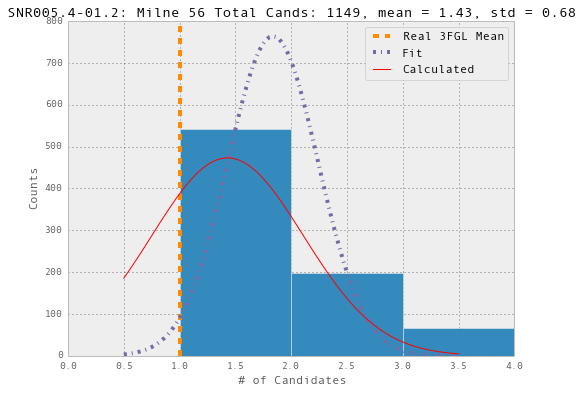

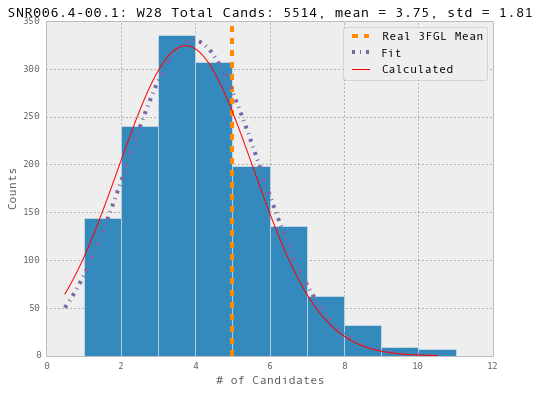

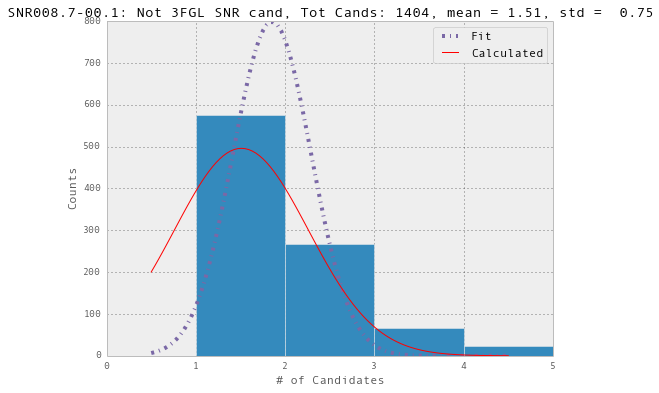

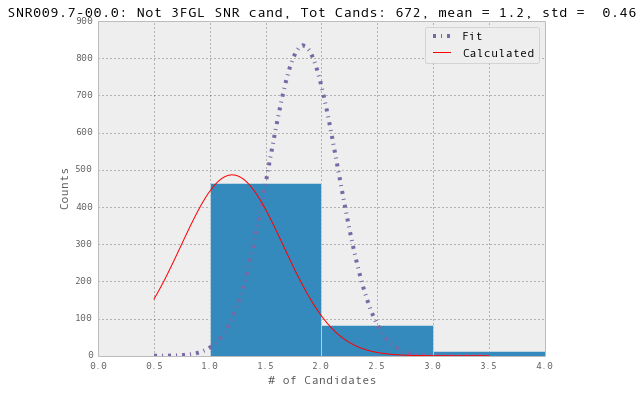

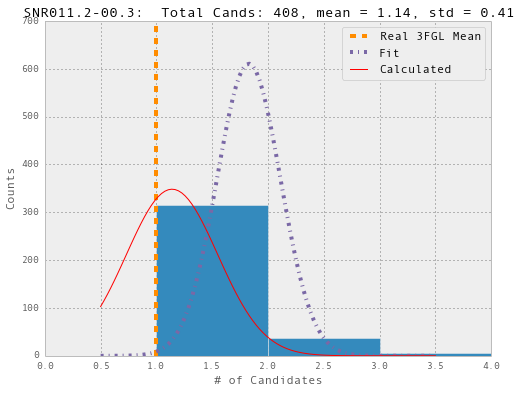

...

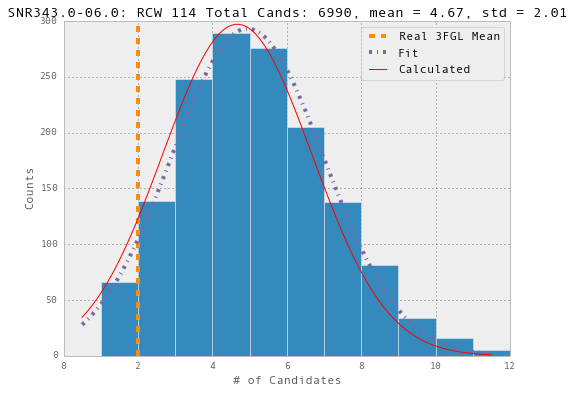

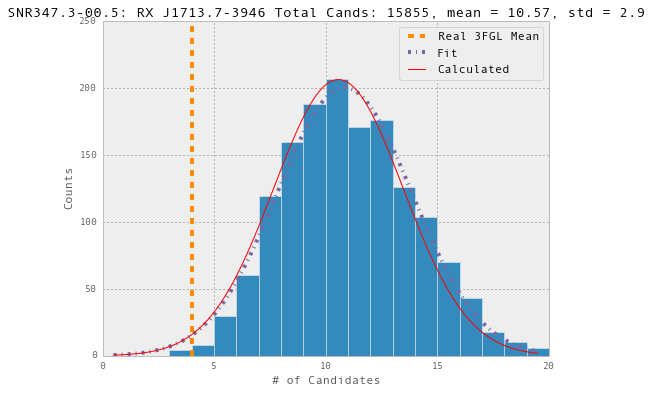

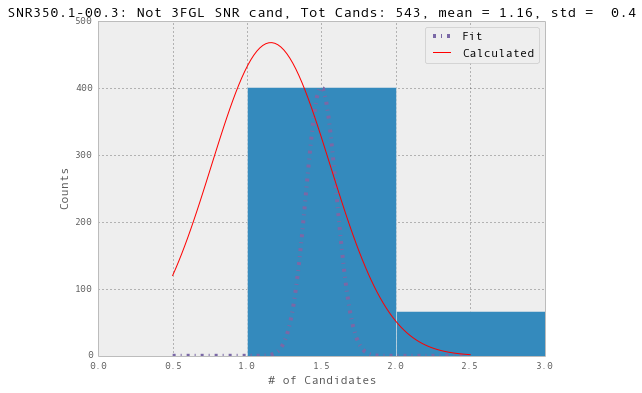

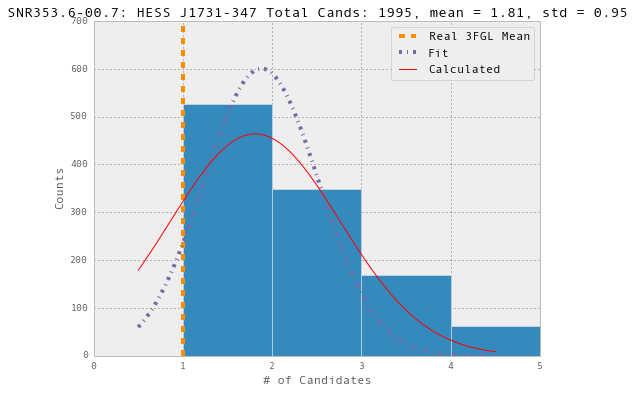

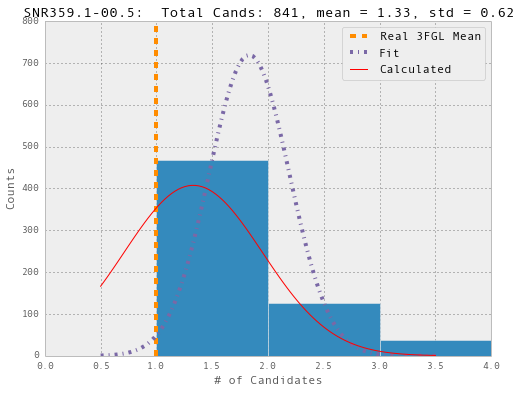

In [197]:
#Normed
%pylab inline
pd.options.display.mpl_style = 'default'
normed = False
for i in numNby4SNRs.columns:
    figure()
    m=round(numNby4SNRs[i].mean(),2)
    s=round(numNby4SNRs[i].std(),2)
    if i in fgl:
        mfgl=fgl.get(i).get('# Nearby')
        nick=fgl.get(i).get('NickName')
        if nick == 'None': nick=''
    else:
        mfgl = None
    maxCands = numNby4SNRs[i].max()
    binsH = np.linspace(0,maxCands, maxCands+1)
    #numNby4SNRs[i].hist(bins = binsH) #my problem with this is that I don't know how to get n, bins from it
    figure(figsize = (8,6))
    n,nbins,_ = hist(numNby4SNRs[i].dropna(), bins = binsH,normed = normed) #hist doesn't handle norms like pandas hist does
    xlabel('# of Candidates')
    xlim(xmin = 0)
    #binsNorm = np.linspace(0,maxCands,100)
    #plot(binsNorm,mlab.normpdf(binsNorm,m,s))
    #y = normpdf(binsH,m,s)
    #plot(binsH,y,'purple')
    totalCands = str(numNby4SNRs[i].sum())
    if mfgl:
        axvline(mfgl,0,1,color = 'DarkOrange',ls='--',lw = 4,label = 'Real 3FGL Mean') #this is the 3FGL value here, for now just plot it as mean
        title('%(i)s: %(nick)s Total Cands: %(totalCands)s, mean = %(m)s, std = %(s)s ' %locals())
    else:
        title('%(i)s: Not 3FGL SNR cand, Tot Cands: %(totalCands)s, mean = %(m)s, std =  %(s)s ' %locals())
        
    # Fit a gaussian to the histogram. Are the bins right?
    x = [0.5 * (nbins[j] + nbins[j+1]) for j in xrange(len(nbins)-1)]
    #x = nbins[:-1]
    try:
        popt, pcov = optimize.curve_fit(gauss, x, n)
        x_fit = np.linspace(x[0], x[-1], 100)
        y_fit = gauss(x_fit, *popt)
        if normed:
            plot(x_fit, y_fit,lw =4,ls = '-.',label = 'Fit')#,label = 'Fit: mean=%(popt[1])s,std=%(popt[2])s '%locals())
        else:
            plot(x_fit, y_fit,lw =4,ls = '-.',label = 'Fit')#,label = 'Fit: mean=%(popt[1])s,std =%(popt[2])s'%locals())
    except RuntimeError, err:
        if mfgl:
            title('%(i)s: %(nick)s, Total Cands: %(totalCands)s, Bad Fit, Dist: mean =  %(m)s, std = %(s)s' %locals())
        else:
            title('%(i)s: Not 3FGL SNR cand, Tot Cands: %(totalCands)s, Bad Fit, Dist: mean = %(m)s, std =%(s)s' %locals())
        pass
    except TypeError, err:
        if mfgl:
            title('%(i)s: %(nick)s, Total Cands: %(totalCands)s, Type Error, Dist: mean =  %(m)s, std = %(s)s' %locals())
        else:
            title('%(i)s: Not 3FGL SNR cand, Tot Cands: %(totalCands)s, Type Error, Dist: mean = %(m)s, std =%(s)s' %locals())
    pass
    #plot a guassian with mean, std derived from the actual distribution
    yNormed = normGauss(x_fit,m,s) #do i use x_fit, or make an array using 
    if normed:
        plot(x_fit,yNormed,label = 'Calculated')
        ylabel('Normed Counts')
    else:
        scale = (nbins[1]-nbins[0])*(len(numNby4SNRs[i]))
        plot(x_fit,yNormed*len(numNby4SNRs[i].dropna()),color = 'r',label = 'Calculated')
        ylabel('Counts')
    legend(loc = 'best')


#Some other things to do

* Run the above without taking ID into consideration

* Try randomizing the ID of each source (binomial with probs determined from real #'s) and re-running
* Do a goodness of fit test,  $\chi^2$ of some sort?

* Still need to get probability of finding the sources I did with real data

* Run for different lshift/bshift

* More realizations? Will that help with the SNRs with low nCands?

* What happens to extened 3FGL sources? If it's listed in 3FGL it just gets treated as a point source here I guess


array([[<matplotlib.axes.AxesSubplot object at 0x112527c10>,
        <matplotlib.axes.AxesSubplot object at 0x1366c1c50>]], dtype=object)

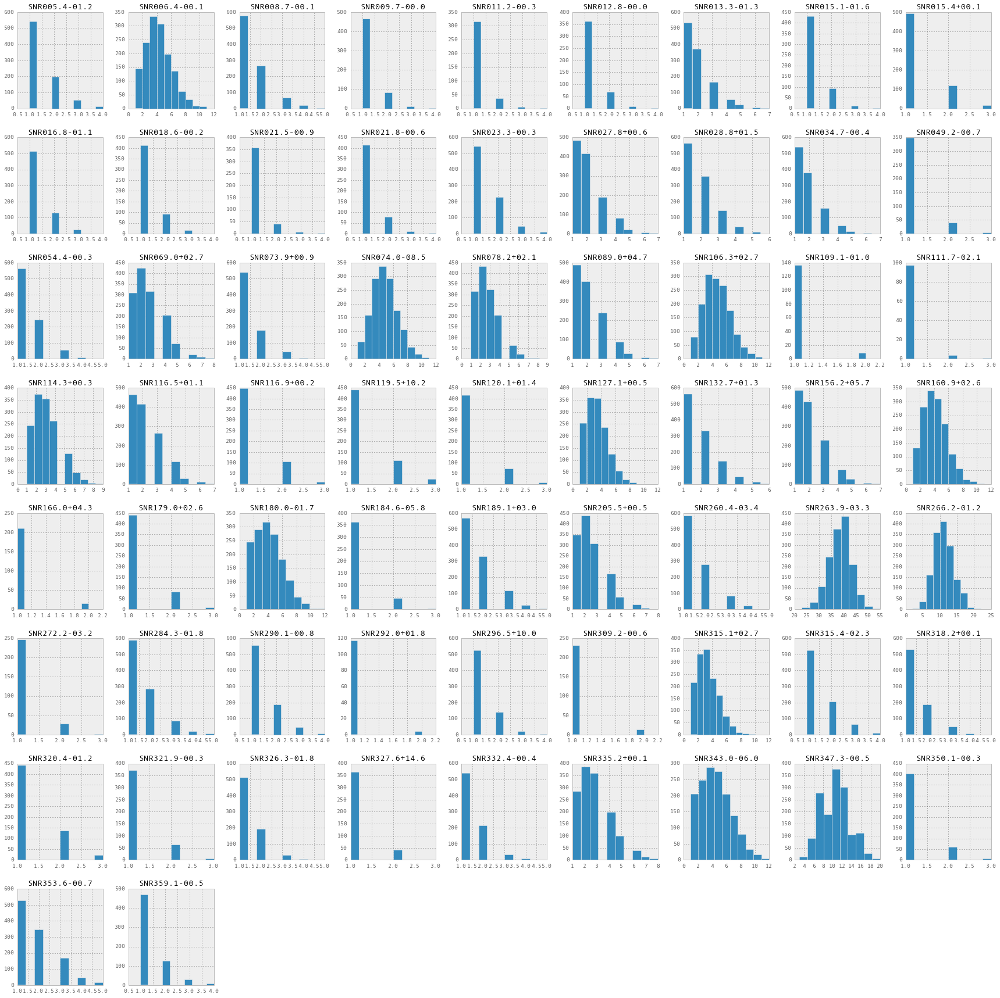

In [47]:
#this makes quick thumbnails for all SNRs, but I don't think I can adjust bin width for individual SNRs like this
#Not sure how to overlay other things on top like gaussian
numNby4SNRs.hist(figsize=(30,30))


In [49]:
#I want to get the mean for all the hists above and plot it vs. the radius of each SNR
#or vs 50pc radius?
p['run0']
nbyInd = p.major_axis.get_loc('# Nearby')
ang50pcInd = p.major_axis.get_loc('50 pc AngSz')
radInd = p.major_axis.get_loc('Rad Radius')
numNby4SNRs = p.major_xs(p.major_axis[nbyInd]).T #default is rows:snrs, cols:runs, want cols:snrs, rows:runs
del numNby4SNRs['# SNR']
del numNby4SNRs['# allNby']
#numNby4SNRs
#can I do major_xs with multiple axes?

,SNR005.4-01.2,SNR006.4-00.1,SNR008.7-00.1,SNR009.7-00.0,SNR011.2-00.3,SNR012.8-00.0,SNR013.3-01.3,SNR015.1-01.6,SNR015.4+00.1,SNR016.8-01.1,SNR018.6-00.2,SNR021.5-00.9,SNR021.8-00.6,SNR023.3-00.3,SNR027.8+00.6,SNR028.8+01.5,SNR034.7-00.4,SNR049.2-00.7,SNR054.4-00.3,SNR069.0+02.7,
# Nearby,NaN,1,NaN,NaN,NaN,NaN,1,NaN,1,1,NaN,NaN,1,2,NaN,3,1,NaN,1,2,...
50 pc AngSz,NaN,1.907784,NaN,NaN,NaN,NaN,1.308118,NaN,0.716831,0.7817233,NaN,NaN,0.6908707,0.9120926,NaN,1.546197,1.21493,NaN,1.28493,2.579859,...
NickName,NaN,W28,NaN,NaN,NaN,NaN,None,NaN,None,None,NaN,NaN,Kes 69,W41,NaN,None,W44,NaN,HC40,CTB 80,...
Rad Radius,NaN,0.4,NaN,NaN,NaN,NaN,0.44,NaN,0.12,0.22,NaN,NaN,0.17,0.23,NaN,0.83,0.26,NaN,0.33,0.67,...
age,NaN,45000,NaN,NaN,NaN,NaN,None,NaN,9000,None,NaN,NaN,None,100000,NaN,32000,20000,NaN,None,None,...
dist,NaN,1.9,NaN,NaN,NaN,NaN,3.3,NaN,4.8,5.1,NaN,NaN,5.5,4.2,NaN,4,3,NaN,3,1.5,...
nearby2FGL,NaN,"{u'P7R42886': {u'pSep': 31.7185247604, u'aSep'...",NaN,NaN,NaN,NaN,"{u'P7R42756G': {u'pSep': 70.966684222, u'aSep'...",NaN,"{u'W28': {u'pSep': 43.2761377577, u'aSep': 0.5...","{u'P7R42865G': {u'pSep': 57.9447458582, u'aSep...",NaN,NaN,"{u'P7R42858G': {u'pSep': 50.8732291628, u'aSep...","{u'P7R42858G': {u'pSep': 65.3468099849, u'aSep...",NaN,"{u'P7R42952': {u'pSep': 61.0927177632, u'aSep'...","{u'P7R42837': {u'pSep': 61.0507863663, u'aSep'...",NaN,"{u'P7R43011C': {u'pSep': 51.1141898359, u'aSep...","{u'P7R43127': {u'pSep': 24.3560651725, u'aSep'...",...


Populating the interactive namespace from numpy and matplotlib
resPanel.dat already exists, load it in
Working on SNR005.4-01.2
Working on SNR006.4-00.1
Working on SNR008.7-00.1
Working on SNR009.7-00.0
Working on SNR011.2-00.3
Working on SNR012.8-00.0
Working on SNR013.3-01.3
Working on SNR015.1-01.6
Working on SNR015.4+00.1
Working on SNR016.8-01.1
Working on SNR018.6-00.2
Working on SNR021.5-00.9
Working on SNR021.8-00.6
Working on SNR023.3-00.3
Working on SNR027.8+00.6
Working on SNR028.8+01.5
Working on SNR034.7-00.4
Working on SNR049.2-00.7
Working on SNR054.4-00.3
Working on SNR069.0+02.7
Working on SNR073.9+00.9
Working on SNR074.0-08.5
Working on SNR078.2+02.1
Working on SNR089.0+04.7
Working on SNR106.3+02.7
Working on SNR109.1-01.0
Working on SNR111.7-02.1
Working on SNR114.3+00.3
Working on SNR116.5+01.1
Working on SNR116.9+00.2
Working on SNR119.5+10.2
Working on SNR120.1+01.4
Working on SNR127.1+00.5
Working on SNR132.7+01.3
Working on SNR156.2+05.7
Working on SNR160.9+02

/Users/jmcohen/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


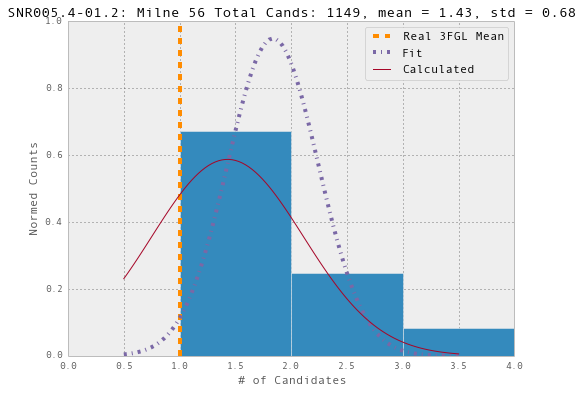

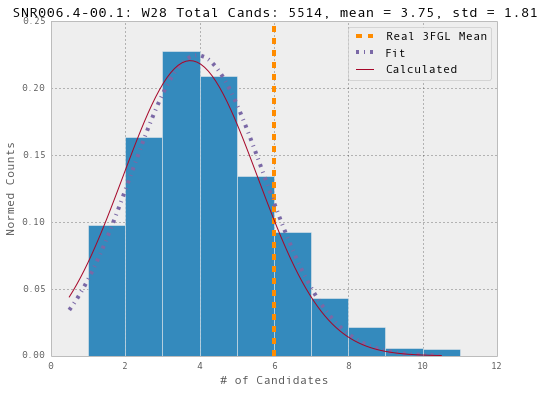

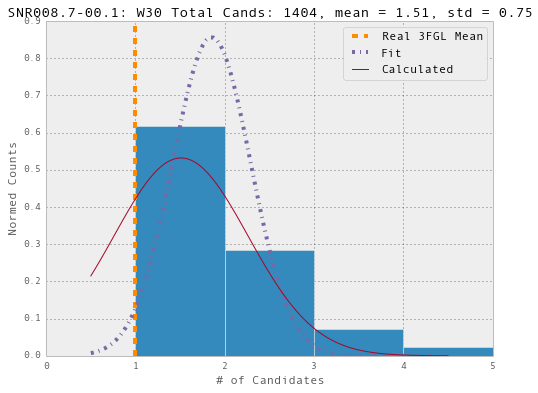

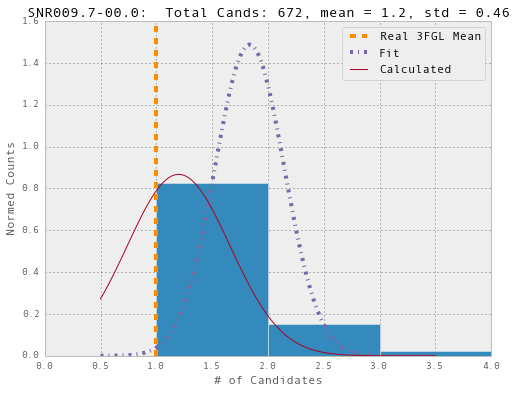

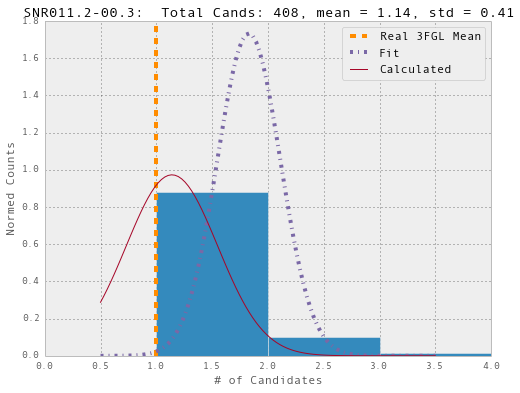

...

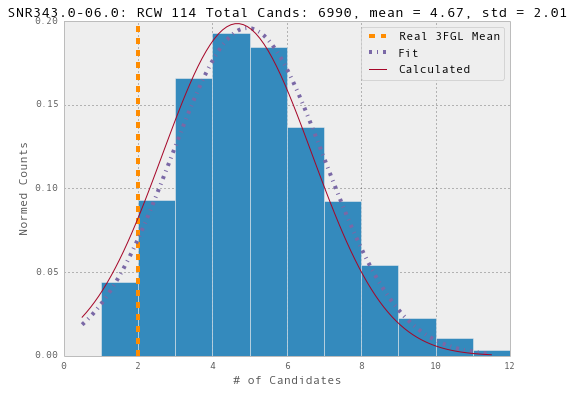

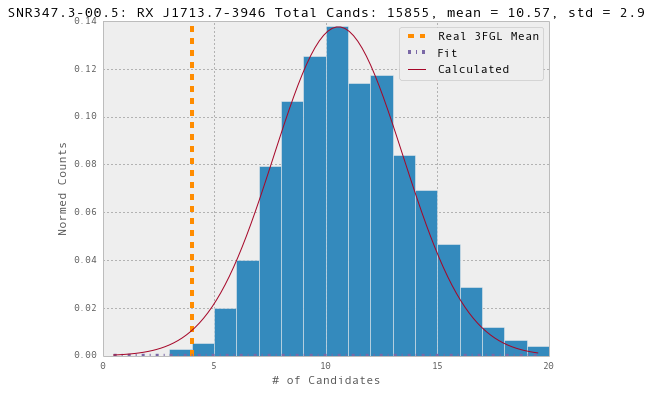

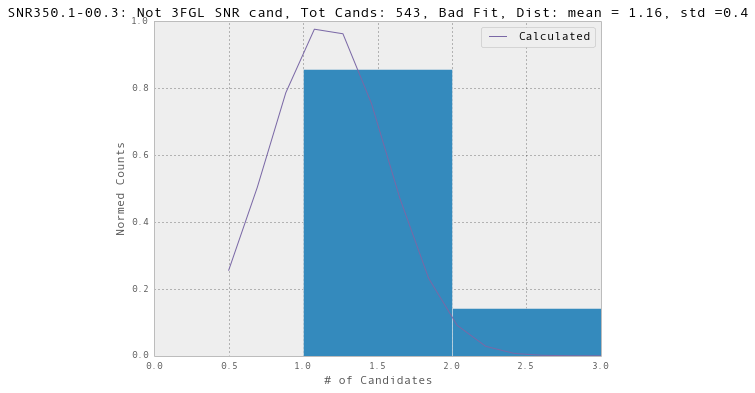

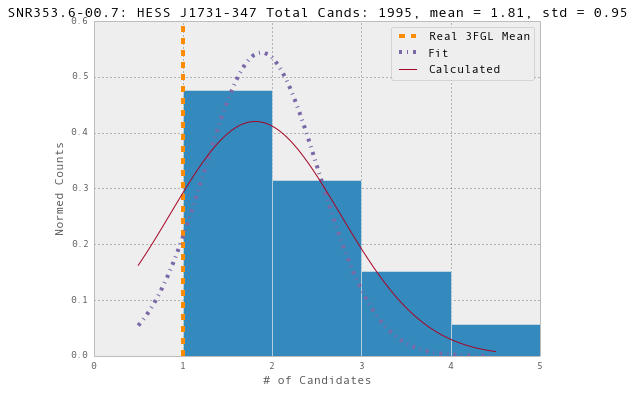

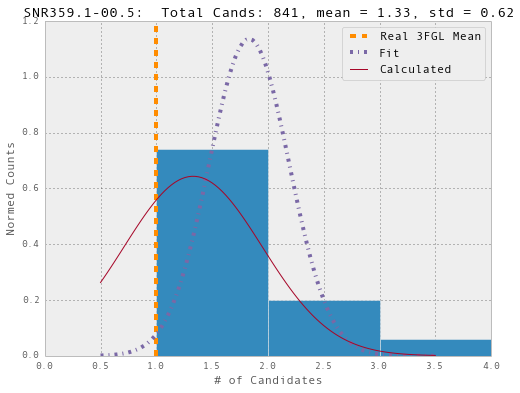

In [3]:
%pylab inline
reload(M)
p = M.postNby(nbyResultsDir = '/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/lbRan_l20_b2_n1500',normed = True, mkPlots = True)

#Chance Probability For a Normaly Distributed Random Variable:
The probability of a random variable r where:

1. r = x: PDF(x), stats.norm(mean,std).pdf(x)
2. r < x or r <= x: CDF(x), stats.norm(mean,std).cdf(x)
3. r > x or r >= x: 1-CDF(x), 1-stats.norm(mean,std).cdf(x)
4. x > r > y:CDF(x)-CDF(y), stats.norm(mean,std).cdf(x) -stats.norm(mean,std).cdf(y)

##Confidence level
nsigma = erfinv(pval)*np.sqrt(2), pval = stats.norm(mean,std).cdf(x)

In [38]:
nbyInd = p.major_axis.get_loc('# Nearby')
numNby4SNRs = p.major_xs(p.major_axis[nbyInd]).T #default is rows:snrs, cols:runs, want cols:snrs, rows:runs
del numNby4SNRs['# SNR']
del numNby4SNRs['# allNby']
numNby4SNRs


      SNR005.4-01.2 SNR006.4-00.1 SNR008.7-00.1 SNR009.7-00.0 SNR011.2-00.3  \
run0            NaN             1           NaN           NaN           NaN   
run1            NaN             1           NaN           NaN           NaN   
run2            NaN             2             2             2           NaN   
run3              1             6           NaN           NaN           NaN   
run4            NaN             2             1           NaN           NaN   
run5              1             6             1           NaN           NaN   
run6              1             2           NaN           NaN           NaN   
run7            NaN             1           NaN             1           NaN   
run8            NaN             8             2           NaN           NaN   
run9              1             1             1             2           NaN   
run10           NaN             2             1           NaN           NaN   
run11           NaN             3           NaN     

In [124]:
#setup the real catalog values
nbyResultsDir = '/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/monteCarlo/lbRan_l20_b2_n1500'
fglYaml  = yaml.load(open('%(nbyResultsDir)s/results_3FGLWid.yaml' %locals())) 
df3l = pd.DataFrame.from_items(fglYaml.items())
del df3l['# SNR']
del df3l['# allNby']
fglNum = df3l.loc['# Nearby']
#pdf
#cdf
#how far is actual value from  mean in STDs
#df = pd.DataFrame({ 'mean':numNby4SNRs.mean(),'std':numNby4SNRs.std(),'totalCands':numNby4SNRs.sum()},'pdf':,'cdf':)
df = pd.DataFrame({ 'mean':numNby4SNRs.mean(),'std':numNby4SNRs.std(),'totalCands':numNby4SNRs.sum()})
df = df.join(fglNum, how = 'outer')
df

,mean,std,totalCands,# Nearby
SNR005.4-01.2,1.425558,0.684372,1149,1
SNR006.4-00.1,3.748470,1.813580,5514,5
SNR008.7-00.1,1.506438,0.749480,1404,NaN
SNR009.7-00.0,1.197861,0.461050,672,NaN
SNR011.2-00.3,1.139665,0.406587,408,1
SNR012.8-00.0,1.202273,0.460261,529,NaN
SNR013.3-01.3,1.867127,1.035442,2164,2
SNR015.1-01.6,1.226766,0.481181,660,NaN
SNR015.4+00.1,1.243631,0.488667,781,1
SNR016.8-01.1,1.276532,0.535899,854,1


In [125]:
def vecPdf(col):
    """Calculate pdf for dataFrame from with mean,std, # Nearby columns"""
    return st.norm(col['mean'],col['std']).pdf(col['# Nearby'])

def vecCdf(col):
    """Calculate pdf for dataFrame from with mean,std, # Nearby columns"""
    return st.norm(col['mean'],col['std']).cdf(col['# Nearby'])

def vecSignif(col):
    """Calculate the confidence level of the coincidences"""
    pval = st.norm(col['mean'],col['std']).cdf(col['# Nearby'])
    return erfinv(pval)*np.sqrt(2) 
     

In [128]:
#apply the prob functions to the data frame
df['pdf'] = df.apply(vecPdf, axis=1)
df['cdf'] = df.apply(vecCdf, axis=1)
df['signif'] = df.apply(vecSignif, axis=1)
df.sort('pdf')

,mean,std,totalCands,# Nearby,pdf,cdf,signif
SNR132.7+01.3,1.758152,0.953320,1941,8,2.054280e-10,1.000000,6.650265
SNR266.2-01.2,10.570000,2.897821,15855,24,2.983921e-06,0.999998,4.775922
SNR332.4-00.4,1.391468,0.639824,1109,4,1.532938e-04,0.999977,4.235398
SNR034.7-00.4,1.812718,0.967084,2081,5,1.806254e-03,0.999509,3.485743
SNR078.2+02.1,2.548505,1.288785,3494,6,8.576335e-03,0.996298,2.902493
SNR347.3-00.5,10.570000,2.899662,15855,4,1.056282e-02,0.011732,0.014705
SNR160.9+02.6,3.622117,1.685069,5339,1,7.054875e-02,0.059843,0.075073
SNR263.9-03.3,38.451333,4.649808,57677,40,8.116842e-02,0.630456,0.897327
SNR343.0-06.0,4.669339,2.010554,6990,2,8.219230e-02,0.092145,0.115744
SNR074.0-08.5,4.311245,1.765235,6441,2,9.590738e-02,0.095214,0.119618


array([[<matplotlib.axes.AxesSubplot object at 0x113ed7a90>]], dtype=object)

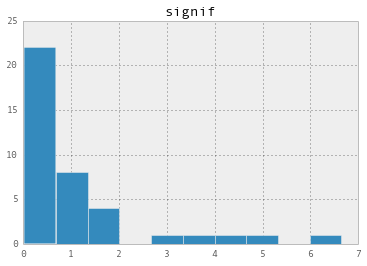

In [129]:
df.hist(column = 'signif')

#For the total population

In [158]:
popPdf = st.norm(mcsWid.mean()[1],mcsWid.std()[1]).pdf(fglWid[' nCands'].values)
popCdf = st.norm(mcsWid.mean()[1],mcsWid.std()[1]).cdf(fglWid[' nCands'].values)
popSignif = erfinv(popCdf)*np.sqrt(2) 
print popPdf, popCdf, popSignif

[ 0.03823073] [ 0.74802264] [ 1.14555976]


In [156]:
#mcsWid

mcsWid.describe()

,nSnrs,nCands
count,1500.000000,1500.000000
mean,39.866000,149.422000
std,3.047551,8.346798
min,29.000000,117.000000
25%,38.000000,144.000000
50%,40.000000,150.000000
75%,42.000000,155.000000
max,50.000000,177.000000


In [6]:
fgl.keys()

ERROR: NameError: name 'fgl' is not defined [IPython.core.interactiveshell]


NameError: name 'fgl' is not defined